# Set-Up

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# !python -m pip install pyyaml==5.1
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

In [ ]:
import torch
import cv2
import os
import random
import glob
import matplotlib.pyplot as plt

from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

# Registering Data To Detectron2 Config

In [ ]:
register_coco_instances("train_dataset", {}, "/content/drive/MyDrive/Data_Science/Melanoma Detection/train_annotations.json", "/content/drive/MyDrive/Data_Science/Melanoma Detection/train")

my_dataset_train_metadata = MetadataCatalog.get("train_dataset")
train_dataset_dicts = DatasetCatalog.get("train_dataset")


register_coco_instances("valid_dataset", {}, "/content/drive/MyDrive/Data_Science/Melanoma Detection/valid_annotations.json", "/content/drive/MyDrive/Data_Science/Melanoma Detection/valid")

my_dataset_valid_metadata = MetadataCatalog.get("valid_dataset")
valid_dataset_dicts = DatasetCatalog.get("valid_dataset")

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



In [ ]:
my_dataset_train_metadata

namespace(name='train_dataset',
          json_file='/content/drive/MyDrive/Data_Science/Melanoma Detection/train_annotations.json',
          image_root='/content/drive/MyDrive/Data_Science/Melanoma Detection/train',
          evaluator_type='coco',
          thing_classes=['benign', 'malignant'],
          thing_dataset_id_to_contiguous_id={0: 0, 1: 1})

> ##### classes = ['benign': 0, 'malignant': 1]

# Visualizing Sample Images

In [ ]:
def viz(df_metadata, data_dicts, l, title):
    fig = plt.figure(figsize = (15, 10))
    fig.suptitle(title, fontsize = 15)
    i = 1
    for d in random.sample(data_dicts, l):
        img = cv2.imread(d["file_name"])
        visualizer = Visualizer(img[:, :, ::-1], metadata = df_metadata, scale = 0.5)
        vis = visualizer.draw_dataset_dict(d)
        #fig.add_subplot(3, 4, i)
        fig.add_subplot(3, 3, i)
        plt.imshow(vis.get_image())
        plt.axis(False)
        i += 1

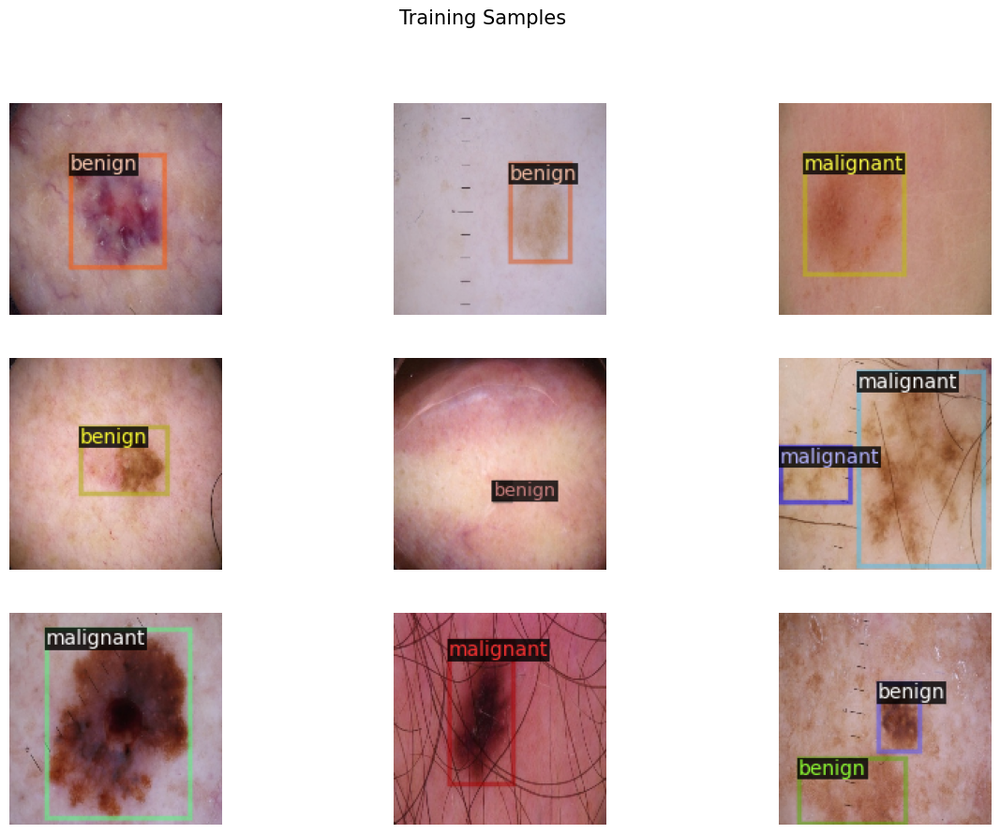

In [ ]:
viz(my_dataset_train_metadata, train_dataset_dicts, 9, "Training Samples")

# Training Detectron2 Instance Segmentation Model

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train_dataset",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 3
cfg.SOLVER.BASE_LR = 0.0025
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
cfg.SOLVER.MAX_ITER = 3000

cfg.SOLVER.WARMUP_ITERS = 500
cfg.SOLVER.STEPS = (1000, 1250, 1500, 1750)
cfg.SOLVER.STEPS = (1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750)
cfg.SOLVER.MOMENTUM = 0.9
cfg.SOLVER.WEIGHT_DECAY = 0.0001
cfg.SOLVER.IMS_PER_BATCH = 5
cfg.SOLVER.BASE_LR = 0.005

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok = True)

trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume = False)
trainer.train()

[05/29 11:19:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:02, 192MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[05/29 11:19:28 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/29 11:20:36 d2.utils.events]:  eta: 2:42:46  iter: 19  total_loss: 0.7469  loss_cls: 0.5922  loss_box_reg: 0.1301  loss_rpn_cls: 0.03801  loss_rpn_loc: 0.009443    time: 3.1816  last_time: 3.0959  data_time: 0.2866  last_data_time: 0.2280   lr: 0.00019481  max_mem: 8348M
[05/29 11:21:47 d2.utils.events]:  eta: 2:41:52  iter: 39  total_loss: 0.3147  loss_cls: 0.1282  loss_box_reg: 0.1501  loss_rpn_cls: 0.01919  loss_rpn_loc: 0.007191    time: 3.2692  last_time: 3.2796  data_time: 0.2401  last_data_time: 0.2355   lr: 0.00039461  max_mem: 8348M
[05/29 11:22:54 d2.utils.events]:  eta: 2:41:02  iter: 59  total_loss: 0.3236  loss_cls: 0.1202  loss_box_reg: 0.1736  loss_rpn_cls: 0.01099  loss_rpn_loc: 0.004854    time: 3.3077  last_time: 3.0873  data_time: 0.2307  last_data_time: 0.2692   lr: 0.00059441  max_mem: 8348M
[05/29 11:24:02 d2.utils.events]:  eta: 2:40:05  iter: 79  total_loss: 0.2844  loss_cls: 0.1038  loss_box_reg: 0.1769  loss_rpn_cls: 0.004097  loss_rpn_loc: 0.004607    tim

# Model Evaluation

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
# Train Dataset Evaluation

evaluator = COCOEvaluator("train_dataset", cfg, False, output_dir = "/content/output")
train_loader = build_detection_test_loader(cfg, "train_dataset")
inference_on_dataset(trainer.model, train_loader, evaluator)

WARNING [05/29 14:13:05 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/29 14:13:05 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/29 14:13:05 d2.data.datasets.coco]: Loaded 1379 images in COCO format from /content/drive/MyDrive/Data_Science/Melanoma Detection/train_annotations.json
[05/29 14:13:05 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/29 14:13:05 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/29 14:13:05 d2.data.common]: Serializing 1379 elements to byte tensors and concatenating them all ...
[05/29 14:13:05 d2.data.common]: Serialized dataset takes 0.37 MiB
[05/29 14:13:05 d2.evaluation.evaluator]: Start inference on 1379

OrderedDict([('bbox',
              {'AP': 63.80655804037274,
               'AP50': 85.08717536446727,
               'AP75': 74.9759288112516,
               'APs': 48.30647704709931,
               'APm': 60.62698828120921,
               'APl': 65.09535165700734,
               'AP-benign': 67.01935822298343,
               'AP-malignant': 60.59375785776204})])

In [ ]:
# Valid Dataset Evaluation

evaluator = COCOEvaluator("valid_dataset", cfg, False, output_dir = "/content/output")
valid_loader = build_detection_test_loader(cfg, "valid_dataset")
inference_on_dataset(trainer.model, valid_loader, evaluator)

WARNING [05/29 14:17:32 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/29 14:17:32 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/29 14:17:32 d2.data.datasets.coco]: Loaded 16 images in COCO format from /content/drive/MyDrive/Data_Science/Melanoma Detection/valid_annotations.json
[05/29 14:17:32 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/29 14:17:32 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/29 14:17:32 d2.data.common]: Serializing 16 elements to byte tensors and concatenating them all ...
[05/29 14:17:32 d2.data.common]: Serialized dataset takes 0.00 MiB
[05/29 14:17:32 d2.evaluation.evaluator]: Start inference on 16 batch

OrderedDict([('bbox',
              {'AP': 49.229798487493284,
               'AP50': 63.79950495049507,
               'AP75': 62.57059323944817,
               'APs': nan,
               'APm': 40.5764701470147,
               'APl': 53.75884016973126,
               'AP-benign': 65.82345836112518,
               'AP-malignant': 32.63613861386139})])

In [ ]:
f = open('/content/output/config.yml', 'w')
f.write(cfg.dump())
f.close()

# Inference

In [ ]:
cfg = get_cfg()
cfg.merge_from_file("/content/output/config.yml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6
cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"
predictor = DefaultPredictor(cfg)

[05/29 14:17:37 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/output/model_final.pth ...


In [ ]:
def inference(PATH):
  img1 = cv2.imread(PATH)
  op1 = predictor(img1[...,::-1])
  print(type(op1))
  print(len(op1))
  print(op1)

  print("\n")

  fig = plt.figure(figsize = (15, 10))

  fig.add_subplot(1, 2, 1)
  plt.imshow(img1[..., ::-1])
  plt.title("Actual")
  plt.axis(False)

  fig.add_subplot(1, 2, 2)
  v = Visualizer(img1[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale = 1.2)
  out = v.draw_instance_predictions(op1["instances"].to("cpu"))
  plt.imshow(out.get_image()[..., ::-1][..., ::-1])
  plt.title("Predicted")
  plt.axis(False)

  plt.show()

<class 'dict'>
1
{'instances': Instances(num_instances=1, image_height=300, image_width=300, fields=[pred_boxes: Boxes(tensor([[ 22.8475,  45.6169, 137.9970, 269.3792]], device='cuda:0')), scores: tensor([0.8234], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}




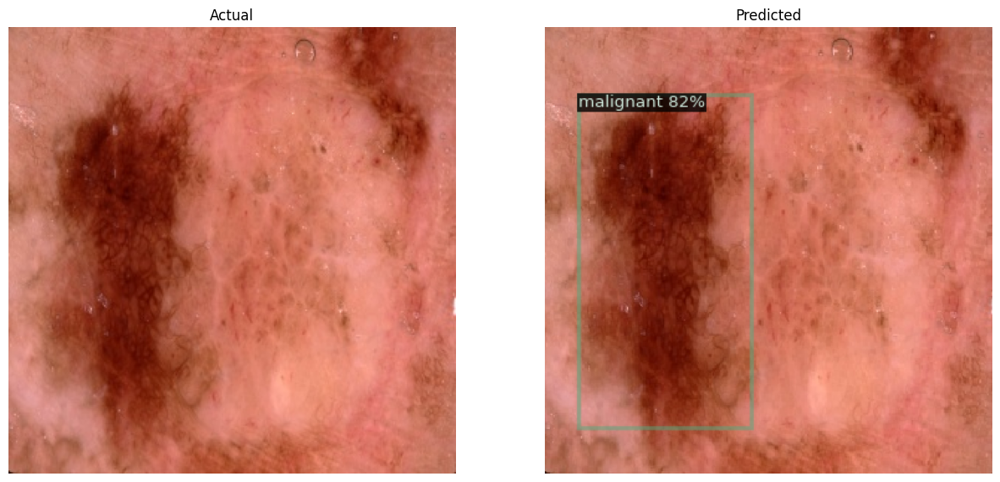

In [ ]:
inference("/content/drive/MyDrive/Data_Science/Detectron2/Dataset/test/ISIC_0015256.jpg")

<class 'dict'>
1
{'instances': Instances(num_instances=1, image_height=300, image_width=300, fields=[pred_boxes: Boxes(tensor([[111.0900,  68.2101, 235.4043, 221.0203]], device='cuda:0')), scores: tensor([0.8866], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}




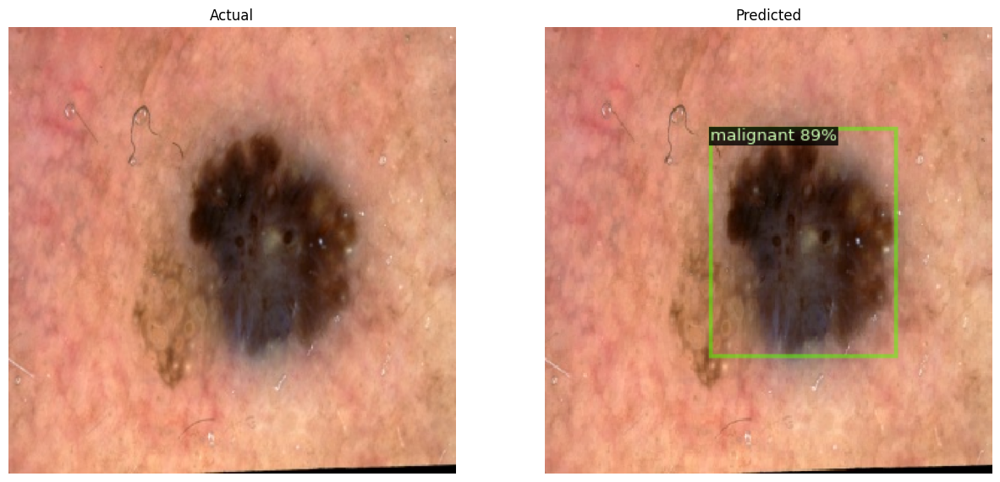

In [ ]:
inference("/content/drive/MyDrive/Data_Science/Detectron2/Dataset/test/ISIC_0015233.jpg")

<class 'dict'>
1
{'instances': Instances(num_instances=1, image_height=300, image_width=300, fields=[pred_boxes: Boxes(tensor([[125.7366,  87.5141, 197.8787, 227.0515]], device='cuda:0')), scores: tensor([0.8084], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}




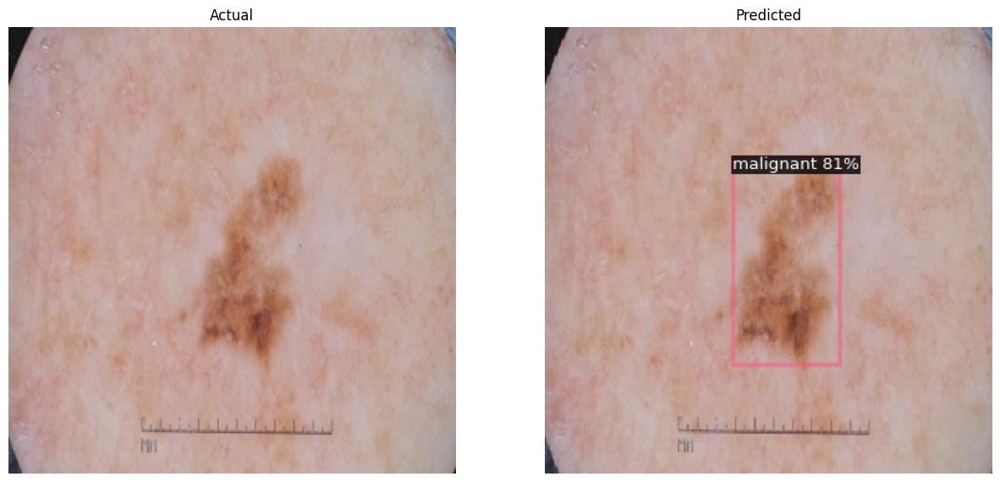

In [ ]:
inference("/content/drive/MyDrive/Data_Science/Detectron2/Dataset/test/ISIC_0016068.jpg")

<class 'dict'>
1
{'instances': Instances(num_instances=1, image_height=300, image_width=300, fields=[pred_boxes: Boxes(tensor([[116.8955, 130.9763, 178.2052, 183.8414]], device='cuda:0')), scores: tensor([0.8624], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}




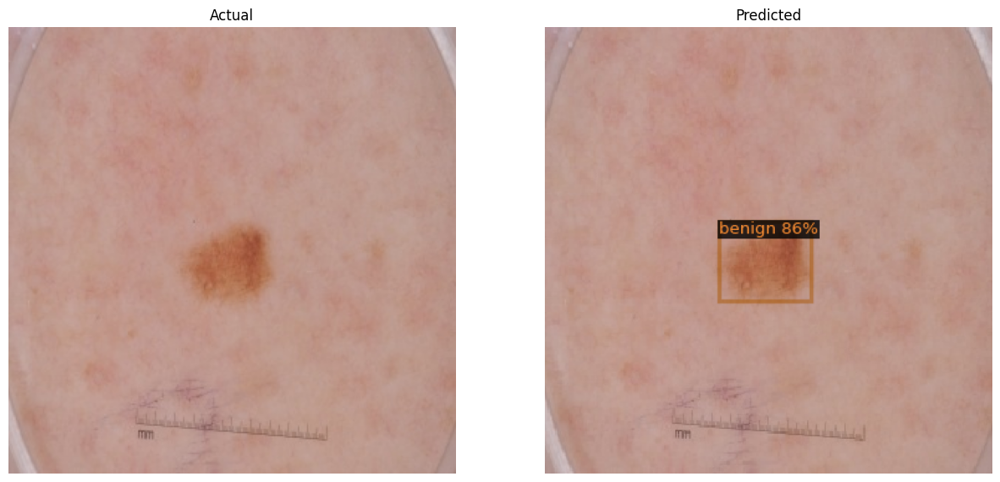

In [ ]:
inference("/content/drive/MyDrive/Data_Science/Detectron2/Dataset/test/ISIC_0016071.jpg")

<class 'dict'>
1
{'instances': Instances(num_instances=1, image_height=300, image_width=300, fields=[pred_boxes: Boxes(tensor([[132.2935, 158.3582, 173.6397, 219.9149]], device='cuda:0')), scores: tensor([0.6369], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}




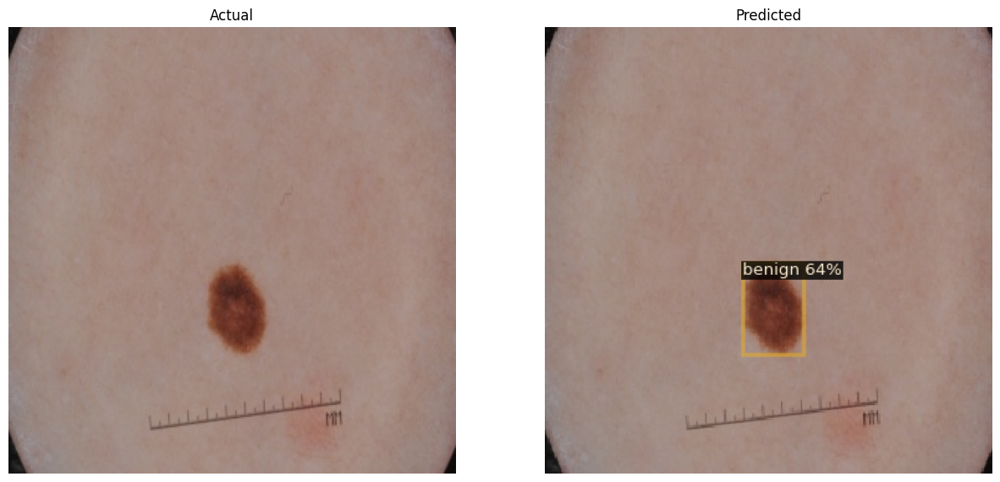

In [ ]:
inference("/content/drive/MyDrive/Data_Science/Detectron2/Dataset/test/ISIC_0016069.jpg")